<a href="https://colab.research.google.com/github/adityaag121/edintelligence-hackathon/blob/main/Challenge2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# EdIntelligence Neurolabs AI compeition

This notebook is heavily inspired from Detectron2's Beginner Tutorial.

## Installing dependencies and setup

In [ ]:
# install dependencies: 
!pip install pyyaml==5.1
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version
# opencv is pre-installed on colab
# install detectron2: (Colab has CUDA 10.1 + torch 1.7)
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
import torch
assert torch.__version__.startswith("1.7")
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.7/index.html
# !pip install pillow==4.1.1
%reload_ext autoreload
%autoreload
# exit(0)  # After installation, you need to "restart runtime" in Colab. This line can also restart runtime

1.7.0+cu101 True
gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
Copyright (C) 2017 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.7/index.html


In [ ]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow
import albumentations as A
from pathlib import Path
from google.colab import drive
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog, build_detection_test_loader 
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

** fvcore version of PathManager will be deprecated soon. **
** Please migrate to the version in iopath repo. **
https://github.com/facebookresearch/iopath 

** fvcore version of PathManager will be deprecated soon. **
** Please migrate to the version in iopath repo. **
https://github.com/facebookresearch/iopath 



## Setup the data

Let us load the synthetic and real images from our drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
FOLDER_OF_COMPETITION_IN_YOUR_DRIVE = 'EdIntelligence-Neurolabs-Hackathon'
for i in Path("/content/drive/MyDrive/" + FOLDER_OF_COMPETITION_IN_YOUR_DRIVE).iterdir():
  print(i)

Mounted at /content/drive
/content/drive/MyDrive/EdIntelligence-Neurolabs-Hackathon/common
/content/drive/MyDrive/EdIntelligence-Neurolabs-Hackathon/challenge-1
/content/drive/MyDrive/EdIntelligence-Neurolabs-Hackathon/challenge-2


In [ ]:
images_dir = Path("/content/drive/MyDrive/EdIntelligence-Neurolabs-Hackathon/common/train/syn/images")
real_images_dir = Path("/content/drive/MyDrive/EdIntelligence-Neurolabs-Hackathon/challenge-2/train/real/images")
annotations_csv_f = Path("/content/drive/MyDrive/EdIntelligence-Neurolabs-Hackathon/common/train/syn/annotations-localization.csv")
real_annotations_csv_f = Path("/content/drive/MyDrive/EdIntelligence-Neurolabs-Hackathon/challenge-2/train/real/annotations.csv")

In [ ]:
# from detectron2.data import transforms as T
# # Define a sequence of augmentations:
# augs = T.AugmentationList([
#     T.RandomBrightness(0.75, 1.25),
#     T.RandomFlip(prob=0.5),
# ])

In [ ]:
from detectron2.structures import BoxMode

class Annotations:
  def __init__(self):
    self.annotations = None
    self.categories = None

  def compute(self,img_dir,ann_csv,max_img):
    if self.annotations == None:
      data = []
    else:
      data = self.annotations

    # first read all the information
    csv_data = {}
    with ann_csv.open() as f:
      for line in f:
        image_name, xmin, ymin, xmax, ymax, label = line.rstrip().split(",")
        if image_name not in csv_data:
          csv_data[image_name] = []
        csv_data[image_name].append([xmin,ymin,xmax,ymax,label])
    print(f"Finished reading data. Images: {len(csv_data.keys())}")

    # get all the labels and sort them (use a dictionary for O(1) lookup)
    categories = []
    for anns in csv_data.values():
      for ann in anns:
        label = ann[4]
        if not label in categories:
          categories.append(label)
    categories = sorted(categories)
    print(f"First 10 categories are {categories[:10]}")
    self.categories = categories
    categories_map = {label:idx for idx,label in enumerate(categories)}

    # convert this to the format that detectron2 wants
    for idx, image_name in enumerate(csv_data.keys()):

      if idx >= max_img: # load more if you want!
        break

      if idx%50 == 0:
        print(f"Processed {idx} images.")
      record = {}

      filename = str(img_dir/image_name)
      height, width = cv2.imread(filename).shape[:2]
      
      record["file_name"] = filename
      record["image_id"] = idx
      record["height"] = height
      record["width"] = width

      annotations = csv_data[image_name]
      objs = []
      for annotation in annotations:
        xmin, ymin, xmax, ymax, label = annotation
        objs.append({
            "bbox": [float(xmin),float(ymin),float(xmax),float(ymax)],
            "bbox_mode": BoxMode.XYXY_ABS,
            "category_id": categories_map[label]
        })
      record["annotations"] = objs
      data.append(record)
    
    self.annotations = data

anns = Annotations()

anns.compute(images_dir,annotations_csv_f,5500) # load the synthetic images

anns.compute(real_images_dir,real_annotations_csv_f,500) #load the real images

print(f"Finished loading annotations.")

Finished reading data. Images: 13200
First 10 categories are ['object']
Processed 0 images.
Processed 50 images.
Processed 100 images.
Processed 150 images.
Processed 200 images.
Processed 250 images.
Processed 300 images.
Processed 350 images.
Processed 400 images.
Processed 450 images.
Processed 500 images.
Processed 550 images.
Processed 600 images.
Processed 650 images.
Processed 700 images.
Processed 750 images.
Processed 800 images.
Processed 850 images.
Processed 900 images.
Processed 950 images.
Processed 1000 images.
Processed 1050 images.
Processed 1100 images.
Processed 1150 images.
Processed 1200 images.
Processed 1250 images.
Processed 1300 images.
Processed 1350 images.
Processed 1400 images.
Processed 1450 images.
Processed 1500 images.
Processed 1550 images.
Processed 1600 images.
Processed 1650 images.
Processed 1700 images.
Processed 1750 images.
Processed 1800 images.
Processed 1850 images.
Processed 1900 images.
Processed 1950 images.
Processed 2000 images.
Processe

In [ ]:
def register(name, load_fn, labels):
  if name in DatasetCatalog.list():
    DatasetCatalog.remove(name)
  if name in MetadataCatalog.list():
    MetadataCatalog.remove(name)
  
  DatasetCatalog.register(name, load_fn)
  MetadataCatalog.get(name).set(thing_classes=labels)

In [ ]:
# Train,val=train_test_split(anns.annotations, shuffle=True)
# register("train", lambda:Train, anns.categories)
# register("val", lambda:val, anns.categories)
#shuffled_anns= shuffle(anns, random_state=None, n_samples=None)
register("train",lambda:anns.annotations, anns.categories)
print("Datasets registered.")

Datasets registered.


In [ ]:
# for d in random.sample(anns.annotations, 1):
#   image = cv2.imread(d["file_name"])
#   input = T.AugInput(image, boxes=d["annotations"].bbox, sem_seg=d["annotations.category_id"])
#   transform = augs(input)  # type: T.Transform
#   image_transformed = input.image  # new image
#   sem_seg_transformed = input.sem_seg

AttributeError: ignored

### Let's visualize some of that data.

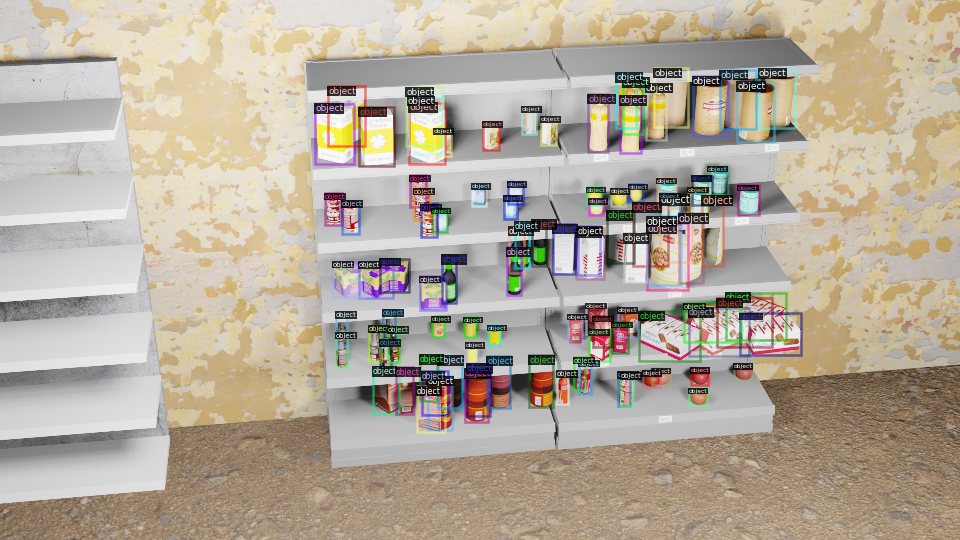

In [ ]:
for d in random.sample(anns.annotations, 1):
  img = cv2.imread(d["file_name"])
  visualizer = Visualizer(img[:, :, ::-1], metadata=MetadataCatalog.get("train"), scale=0.5)
  out = visualizer.draw_dataset_dict(d)
  cv2_imshow(out.get_image()[:, :, ::-1])

## Now we train!

In [ ]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("train",)
# cfg.DATASETS.TEST = ("train",)
cfg.DATALOADER.NUM_WORKERS = 8
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 1
cfg.SOLVER.BASE_LR = 0.00125  # pick a good LR
cfg.SOLVER.MAX_ITER = 12000 
# cfg.SOLVER.GAMMA = 0.1
cfg.SOLVER.STEPS = ()        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 256   # faster, and good enough for this dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = len(anns.categories)  # number of classes


os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[02/21 10:17:25 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (2, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (2,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.


[02/21 10:17:26 d2.engine.train_loop]: Starting training from iteration 0
[02/21 10:17:36 d2.utils.events]:  eta: 1:22:09  iter: 19  total_loss: 1.844  loss_cls: 0.727  loss_box_reg: 0.702  loss_rpn_cls: 0.2306  loss_rpn_loc: 0.1661  time: 0.4002  data_time: 0.0667  lr: 2.4976e-05  max_mem: 6697M
[02/21 10:17:44 d2.utils.events]:  eta: 1:21:24  iter: 39  total_loss: 1.601  loss_cls: 0.5781  loss_box_reg: 0.697  loss_rpn_cls: 0.1581  loss_rpn_loc: 0.1749  time: 0.3989  data_time: 0.0026  lr: 4.9951e-05  max_mem: 6697M
[02/21 10:17:52 d2.utils.events]:  eta: 1:21:31  iter: 59  total_loss: 1.488  loss_cls: 0.4805  loss_box_reg: 0.7126  loss_rpn_cls: 0.1118  loss_rpn_loc: 0.1802  time: 0.4027  data_time: 0.0031  lr: 7.4926e-05  max_mem: 6697M
[02/21 10:18:01 d2.utils.events]:  eta: 1:22:24  iter: 79  total_loss: 1.38  loss_cls: 0.4299  loss_box_reg: 0.6765  loss_rpn_cls: 0.09676  loss_rpn_loc: 0.1675  time: 0.4070  data_time: 0.0028  lr: 9.9901e-05  max_mem: 6697M
[02/21 10:18:08 d2.utils.

FileNotFoundError: ignored

## Evaluation

Here we just evaluate against the training dataset. However, ideally you should set aside some data for evaluation.

In [ ]:
test_dataset_name = "train" # this should be a different dataset that you've registered
cfg.DATASETS.TEST = (test_dataset_name,) 

evaluator = COCOEvaluator(test_dataset_name, cfg, False, output_dir="./output/")
loader = build_detection_test_loader(cfg, test_dataset_name)
eval_results = inference_on_dataset(trainer.model, loader, evaluator)
print(eval_results)

WARNING [02/20 17:22:31 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass tasks in directly
[02/20 17:22:31 d2.evaluation.coco_evaluation]: 'train' is not registered by `register_coco_instances`. Therefore trying to convert it to COCO format ...
[02/20 17:22:31 d2.data.datasets.coco]: Converting annotations of dataset 'train' to COCO format ...)
[02/20 17:22:31 d2.data.datasets.coco]: Converting dataset dicts into COCO format
[02/20 17:22:31 d2.data.datasets.coco]: Conversion finished, #images: 10, #annotations: 804
[02/20 17:22:31 d2.data.datasets.coco]: Caching COCO format annotations at './output/train_coco_format.json' ...
[02/20 17:22:31 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[02/20 17:22:31 d2.data.common]: Serializing 10 elements to byte tensors and concatenating them all ...
[02/20 17:22:31 d

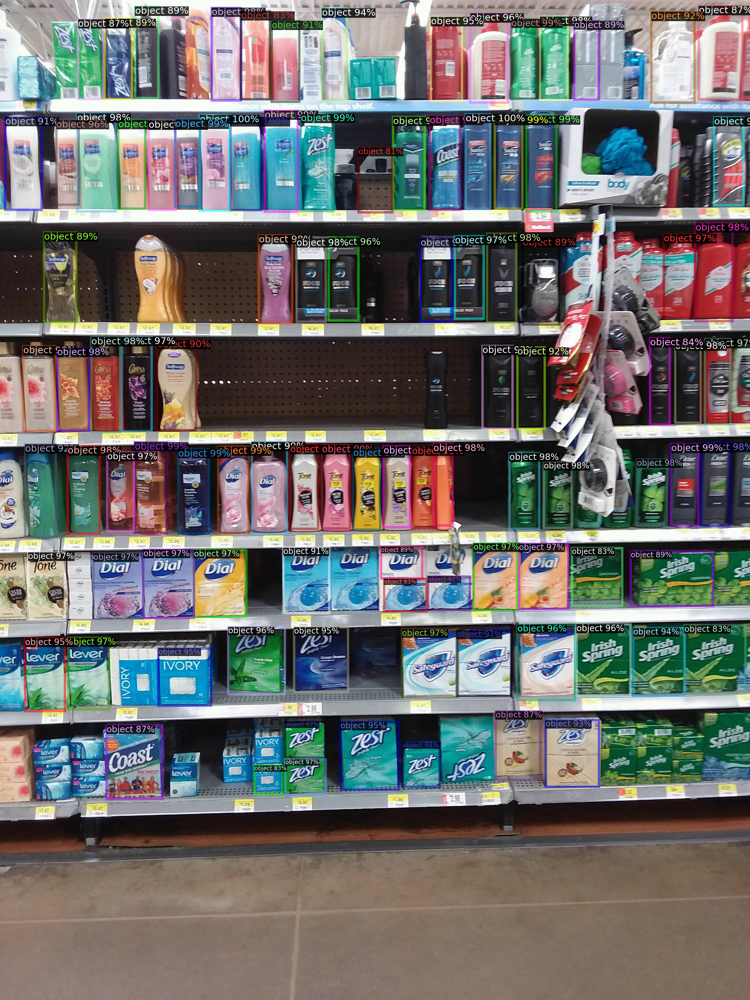

In [ ]:
# visualize inference on some images
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.06
 # if you want to allow predictions with lower accuracy
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
test_dataset_name='train'
predictor = DefaultPredictor(cfg)
for d in random.sample(DatasetCatalog.get(test_dataset_name), 1):
  img = cv2.imread("/content/drive/MyDrive/EdIntelligence-Neurolabs-Hackathon/challenge-2/test/images/test_825.jpg")
  outputs = predictor(img)
  visualizer = Visualizer(img[:, :, ::-1], metadata=MetadataCatalog.get(test_dataset_name), scale=1)
  # out = visualizer.draw_dataset_dict(d) # these are the ground truths 
  out = visualizer.draw_instance_predictions(outputs["instances"].to("cpu"))
  cv2_imshow(out.get_image()[:, :, ::-1])

## Running inference on test images


In [ ]:
import csv
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set a custom testing threshold
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
predictor=DefaultPredictor(cfg)
real_images_dir = Path("/content/drive/MyDrive/EdIntelligence-Neurolabs-Hackathon/challenge-2/test/images")
with open('predictions.csv','w') as file:
  writer = csv.writer(file)
  for num,f in enumerate(real_images_dir.iterdir()):
    output=predictor(cv2.imread(str(f)))
    output=output['instances'].to('cpu')
    for i,box in enumerate(output.pred_boxes):
      row=[f.name]+box.numpy().astype(int).tolist()+[anns.categories[output.pred_classes[i]]]
      writer.writerow(row)
      # break
    print(num,f.name,len(output))
    # break

0 test_202.jpg 100
1 test_208.jpg 77
2 test_231.jpg 97
3 test_187.jpg 72
4 test_237.jpg 78
5 test_70.jpg 86
6 test_154.jpg 100
7 test_42.jpg 100
8 test_91.jpg 85
9 test_115.jpg 100
10 test_192.jpg 100
11 test_219.jpg 100
12 test_213.jpg 100
13 test_49.jpg 100
14 test_114.jpg 100
15 test_1.jpg 93
16 test_117.jpg 97
17 test_171.jpg 95
18 test_65.jpg 100
19 test_47.jpg 100
20 test_12.jpg 100
21 test_74.jpg 100
22 test_10.jpg 97
23 test_147.jpg 100
24 test_223.jpg 100
25 test_56.jpg 100
26 test_215.jpg 100
27 test_200.jpg 100
28 test_190.jpg 100
29 test_172.jpg 100
30 test_189.jpg 86
31 test_75.jpg 64
32 test_184.jpg 60
33 test_4.jpg 100
34 test_77.jpg 100
35 test_27.jpg 87
36 test_11.jpg 100
37 test_48.jpg 92
38 test_118.jpg 100
39 test_78.jpg 100
40 test_100.jpg 100
41 test_15.jpg 100
42 test_83.jpg 100
43 test_35.jpg 69
44 test_104.jpg 54
45 test_8.jpg 73
46 test_86.jpg 100
47 test_113.jpg 82
48 test_142.jpg 57
49 test_72.jpg 100
50 test_29.jpg 100
51 test_26.jpg 100
52 test_166.jpg 74


In [ ]:
# from detectron2.modeling import build_model
# cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.6   # set a custom testing threshold
# model = build_model(cfg)
# from detectron2.checkpoint import DetectionCheckpointer
# DetectionCheckpointer(model).load("./output/model_final.pth")
# model.train(False)
# images=[]
# for f in real_images_dir.iterdir():
#   images.append(cv2.imread(str(f)))
#   break
# inputs=[{'image':torch.from_numpy(image.astype("float32").transpose(2,0,1))} for image in images]
# print(inputs)
# with torch.no_grad():
#   preds=model(inputs)
# print(preds)

[{'image': tensor([[[174, 172, 170,  ..., 109, 112, 121],
         [174, 172, 171,  ..., 108, 108, 114],
         [174, 172, 171,  ..., 103, 100, 103],
         ...,
         [150, 149, 148,  ...,  21,  19,  27],
         [151, 150, 148,  ...,  22,  17,  24],
         [151, 150, 148,  ...,  22,  14,  19]],

        [[179, 177, 175,  ..., 163, 166, 175],
         [179, 177, 176,  ..., 162, 162, 168],
         [179, 177, 176,  ..., 157, 154, 157],
         ...,
         [166, 165, 164,  ...,  55,  52,  60],
         [167, 166, 164,  ...,  56,  50,  57],
         [167, 166, 164,  ...,  56,  47,  52]],

        [[188, 186, 184,  ...,  73,  76,  85],
         [188, 186, 185,  ...,  72,  72,  78],
         [188, 186, 185,  ...,  67,  64,  67],
         ...,
         [173, 172, 171,  ...,   1,   1,   9],
         [174, 173, 171,  ...,   2,   0,   6],
         [174, 173, 171,  ...,   2,   0,   1]]], dtype=torch.uint8)}]
[{'instances': Instances(num_instances=0, image_height=3264, image_width=2